In [1]:
# Downloading our library 
import os
directory = "seminar-dlmb-2025-winter-public"

if os.path.exists(directory) and os.listdir(directory):
    print(f"Directory {directory} exists and is non-empty.")
else:
    print(f"Directory {directory} does not exist or is empty.")
    !!git clone https://github.com/hzi-bifo/seminar-dlmb-2025-winter-public.git


Directory seminar-dlmb-2025-winter-public exists and is non-empty.


In [ ]:
%pip install biopython
%pip install seaborn

# Loading hard dataset: all contigs of Staphylococcus aureus 

In [3]:
import sys
sys.path.append('seminar-dlmb-2025-winter-public/src/')
# from utility.file_utility import FileUtility
from amr.amr_utility import get_seq_label_fold, get_seq_label_simple, get_seq_label_hard

# Loading hard dataset
ds = get_seq_label_hard("Staphylococcus_aureus_cefoxitin")
# a = {l : [([ss[0:3]+'.' for ss in s], ll) for s, ll in seq_labels] for l, seq_labels in a.items()} # only prints first 3 letters of each sequence
# print(f"Easy dataset: { {l : len(seqs) for l, seqs in a.items()} }")

seq_train = [x[0] for x in ds["train"]]
y_train = [x[1] for x in ds["train"]]

seq_test = [x[0] for x in ds["test"]]
y_test = [x[1] for x in ds["test"]]



In [4]:
print('Num of samples in train data: {}'.format(len(seq_train)))
print('Num of samples in test data: {}'.format(len(seq_test)))


Num of samples in train data: 847
Num of samples in test data: 107


In [14]:
# Note that, here, each seq_train contains a list of sequences, instead of just one sequence.

# print('Input of the first element:\n{}'.format(seq_train[0]))
# print('First label: {} -> resistant'.format(y_train[0]))

# print('Input of the 26th element:\n{}'.format(seq_train[26]))
# print('26th label: {} -> resistant'.format(y_train[26]))

# print(y_train[0], seq_train[0])
# print(y_train[26], seq_train[26])
print('Sequences in the first element: label={}'.format(y_train[0]))
for k, s in seq_train[0].items():
    print(f'{k}:{s}')

print('Sequences in the 26th element: label={}'.format(y_train[26]))
for k, s in seq_train[26].items():
    print(f'{k}:{s}')



Sequences in the first element: label=1
1280.29722.con.0001:GGAAGTCCAATTTCTCTGTGTTGGGGCCCCGCTATGATTGAAAAGTTTGTTATAGGTGTATTTTCTTTTGGTTAACTATTGGTAATACAACATTGTAGATTTTAGGATGTTGATTTTTGACTTAGCCTTTGTCTGCTTATGTTAAATGTTACAGCTAGTCAAACATTGAGTTTGTAATTATTATATTAAGCTAGTTTAAATTTTTTGTGATTTATGTTTTATTCATACCAATTTTGTGAAATGATACAGTGACAGATGTTTATTGATTTTAAAGGGTGATGATGATGGCTATTGTAAATAAAGTGATAATTGTTGAAGGAAAATCTGATAAAAAAAGGGTGCAACAGGTTATTGCAGAACCAGTCAATATTATTTGTACTCATGGAACAATGAGTATAGATAAGCTTGATGATATGATAGAATCACTATATGATAAACAAGTTTTTGTATTAGCCGATTCTGATGACGAAGGAGATCGAATTAGAAATTGGTTTAAACGTTATTTGAGTGAAAGTGAACATATATTTATTGATAAAACTTACTGTCAAGTTGCGAATTGCCCCAAACAATATTTGGCGCATGTACTTTCAAAACATGGCTTTACTTGTAAGAAAGAAACACCTCTTTTACCGAATATAAATAATGAAAGGTTAGTTTTAGTAAATGAATAATTCATTAGACATCAAAGATGTAACTACATTTTATGAGGAAGACAAACATTTAATCTTTGGTTATACACCAACGTGTGGTACTTGTAAGGTTTCAGAAAGAATGTTAGACATTGCTAATGAAATATTGCAGTTACCATTATTGAAAATAGATTTAAACTTTTATCCTCAGTTTTGTAAAGATATGCAAATCATGTCTACGCCGATTTTATTGTTGATGAATAAAGATAAAGAAGTAAAACGAATTTATGCATTTAAATCGGTGACTGATT

In [15]:
dup_count, all_count = 0, 0
for s1 in seq_train:
    for s2 in seq_train:
        dup_count += s1 == s2
        all_count += 1
print('Number of non-duplicate pairs: {} (Number of duplicate pairs: {})'.format(all_count - dup_count, dup_count))

Number of non-duplicate pairs: 716562 (Number of duplicate pairs: 847)


In [19]:
import seaborn as sns
import numpy as np

Median and mean sequence length: 2785030.0, 2781121.73553719


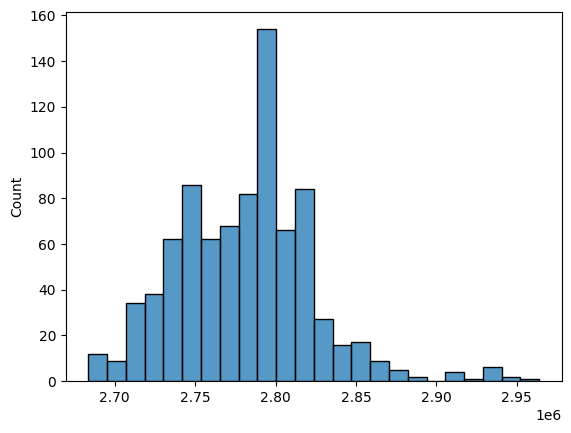

In [20]:
len_train = [sum([len(s) for k, s in st.items()]) for st in seq_train]
sns.histplot(len_train)
median = np.median(len_train)
mean = np.mean(len_train)
print('Median and mean sequence length: {}, {}'.format(median, mean))

In [21]:
uniq_vals = set(y_train)
y_train_int = list(map(int, y_train))
print('Labels in training data')
print('Non resistant: {}'.format(y_train_int.count(0)))
print('Resistant: {}'.format(y_train_int.count(1)))

Labels in training data
Non resistant: 192
Resistant: 655


In [22]:
uniq_vals = set(y_test)
y_test_int = list(map(int, y_test))
print('Labels in test data')
print('Non resistant: {}'.format(y_test_int.count(0)))
print('Resistant: {}'.format(y_test_int.count(1)))

Labels in test data
Non resistant: 25
Resistant: 82


# Loading hardest dataset: all contigs of Klebsiella pneumoniae

In [23]:
import sys
sys.path.append('seminar-dlmb-2025-winter-public/src/')
# from utility.file_utility import FileUtility
from amr.amr_utility import get_seq_label_fold, get_seq_label_simple, get_seq_label_hard

# Loading hard dataset
ds = get_seq_label_hard("Klebsiella_pneumoniae_aztreonam")
# a = {l : [([ss[0:3]+'.' for ss in s], ll) for s, ll in seq_labels] for l, seq_labels in a.items()} # only prints first 3 letters of each sequence
# print(f"Easy dataset: { {l : len(seqs) for l, seqs in a.items()} }")

seq_train = [x[0] for x in ds["train"]]
y_train = [x[1] for x in ds["train"]]

seq_test = [x[0] for x in ds["test"]]
y_test = [x[1] for x in ds["test"]]



Extracting data/Klebsiella_pneumoniae_aztreonam/seq: 100%|██████████| 1278/1278 [01:46<00:00, 12.04file/s]


In [24]:
print('Num of samples in train data: {}'.format(len(seq_train)))
print('Num of samples in test data: {}'.format(len(seq_test)))


Num of samples in train data: 1135
Num of samples in test data: 143


In [25]:
# Note that, here, each seq_train contains a list of sequences, instead of just one sequence.

# print('Input of the first element:\n{}'.format(seq_train[0]))
# print('First label: {} -> resistant'.format(y_train[0]))

# print('Input of the 26th element:\n{}'.format(seq_train[26]))
# print('26th label: {} -> resistant'.format(y_train[26]))

# print(y_train[0], seq_train[0])
# print(y_train[26], seq_train[26])
print('Sequences in the first element: label={}'.format(y_train[0]))
for k, s in seq_train[0].items():
    print(f'{k}:{s}')

print('Sequences in the 26th element: label={}'.format(y_train[26]))
for k, s in seq_train[26].items():
    print(f'{k}:{s}')



Sequences in the first element: label=1
573.14018.con.0001:TTCGGGGAGGAGAGGCAGGGAAATAGTCCGACTACGCCCTGCCTCTTACTCTACTCCGCACCTGGCAGGGCTGGCTGTATCTGGCGGTGGTTATCGATCTCTTTGCCCGTAATGTGGTCGGCTGGTCGATGAAACCCACTCTCTCGCGCGAACTGGCGCTCGACGCGCTGATGATGGCGGTCTGGCGCCGAAAACCGGACGGCGAGGTCATCGTACATAGCGATCAAGGTAGTCATTACGGCAGTGACGACTGGCAGCGCTTCTGCCGGGCCAATAACCTGGCACCGAGCATGAGCCGGCGTGGCAACTGCTGGGATAATGCGGTGGCCGAATCGTTCTTCAGTTCACTGAAAAAAGAACGCATCAGGAAGCGGATATATAAAACCCGGGACATGGCCCGGGCGGATATTTTCGATTACATTGAAGTGTTCTACAACCGTAACCGACGCCACAGCCACCTCGGTGGCGTCAGTCCGGAGGCCTTCGAACAGGCCTCGTCGTGAGGACAGAAACTTTCTACCGGAGCGTGGTCACTCCACACAACGGCTCTGAAGTGTCTAGATTATCCGCGGCGATTCACACCTTTGCTACTCGTCACATTAGCCGAGGCGCAAACCTCTTCTGGTTAGCATCGCATATGGGTCACAAAGGTCCTGAATTGCTTTTCAGGCATTATGGTCGTTATCTTAAGGAGTATGATAATAGCACCTCCAATACCTCGTTGAAAAAAAATCTAATATGACAAATAATCCCTTCTTATAGTTAAGGAAGGGATATCAAGATGGCTGATCCAACATGGTTAGGACTAGGTGGCCTTGTTGCTAGTACTTTGTCTGCTTTAGCTGCTTATTTAGCTATACGGCAGAATATTATCCAAAGGAGGATATCAAACAAAGTCCAAATCACCGTAAAAGGAGTTGAAATTAACCTAGCGAGAAGGA

In [26]:
dup_count, all_count = 0, 0
for s1 in seq_train:
    for s2 in seq_train:
        dup_count += s1 == s2
        all_count += 1
print('Number of non-duplicate pairs: {} (Number of duplicate pairs: {})'.format(all_count - dup_count, dup_count))

Number of non-duplicate pairs: 1287090 (Number of duplicate pairs: 1135)


In [27]:
import seaborn as sns
import numpy as np

Median and mean sequence length: 5501565.0, 5517197.4


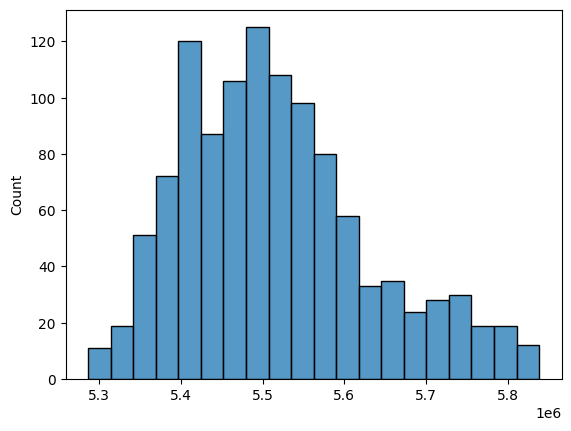

In [28]:
len_train = [sum([len(s) for k, s in st.items()]) for st in seq_train]
sns.histplot(len_train)
median = np.median(len_train)
mean = np.mean(len_train)
print('Median and mean sequence length: {}, {}'.format(median, mean))

In [29]:
uniq_vals = set(y_train)
y_train_int = list(map(int, y_train))
print('Labels in training data')
print('Non resistant: {}'.format(y_train_int.count(0)))
print('Resistant: {}'.format(y_train_int.count(1)))

Labels in training data
Non resistant: 104
Resistant: 1031


In [30]:
uniq_vals = set(y_test)
y_test_int = list(map(int, y_test))
print('Labels in test data')
print('Non resistant: {}'.format(y_test_int.count(0)))
print('Resistant: {}'.format(y_test_int.count(1)))

Labels in test data
Non resistant: 14
Resistant: 129
